In [1]:
!pip install scikit_plot

In [1]:
#imports
import pandas as pd 
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

from scipy.cluster.hierarchy import linkage, dendrogram, fcluster
from scipy.spatial.distance import pdist, squareform

from sklearn.metrics import pairwise_distances
from sklearn.preprocessing import StandardScaler

from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.neighbors import NearestNeighbors
from sklearn.metrics import silhouette_samples, silhouette_score

import scikitplot as skplot

In [2]:
bank = pd.read_csv('CC GENERAL.csv')

In [3]:
bank.columns = bank.columns.str.lower()

In [4]:
#check how many null values and data type in each varabie
bank.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8950 entries, 0 to 8949
Data columns (total 18 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   cust_id                           8950 non-null   object 
 1   balance                           8950 non-null   float64
 2   balance_frequency                 8950 non-null   float64
 3   purchases                         8950 non-null   float64
 4   oneoff_purchases                  8950 non-null   float64
 5   installments_purchases            8950 non-null   float64
 6   cash_advance                      8950 non-null   float64
 7   purchases_frequency               8950 non-null   float64
 8   oneoff_purchases_frequency        8950 non-null   float64
 9   purchases_installments_frequency  8950 non-null   float64
 10  cash_advance_frequency            8950 non-null   float64
 11  cash_advance_trx                  8950 non-null   int64  
 12  purcha

In [5]:
bank.describe().T

,count,mean,std,min,25%,50%,75%,max
balance,8950.0,1564.474828,2081.531879,0.000000,128.281915,873.385231,2054.140036,19043.13856
balance_frequency,8950.0,0.877271,0.236904,0.000000,0.888889,1.000000,1.000000,1.00000
purchases,8950.0,1003.204834,2136.634782,0.000000,39.635000,361.280000,1110.130000,49039.57000
oneoff_purchases,8950.0,592.437371,1659.887917,0.000000,0.000000,38.000000,577.405000,40761.25000
installments_purchases,8950.0,411.067645,904.338115,0.000000,0.000000,89.000000,468.637500,22500.00000
cash_advance,8950.0,978.871112,2097.163877,0.000000,0.000000,0.000000,1113.821139,47137.21176
purchases_frequency,8950.0,0.490351,0.401371,0.000000,0.083333,0.500000,0.916667,1.00000
oneoff_purchases_frequency,8950.0,0.202458,0.298336,0.000000,0.000000,0.083333,0.300000,1.00000
purchases_installments_frequency,8950.0,0.364437,0.397448,0.000000,0.000000,0.166667,0.750000,1.00000
cash_advance_frequency,8950.0,0.135144,0.200121,0.000000,0.000000,0.000000,0.222222,1.50000


In [6]:
bank.head()

,cust_id,balance,balance_frequency,purchases,oneoff_purchases,installments_purchases,cash_advance,purchases_frequency,oneoff_purchases_frequency,purchases_installments_frequency,cash_advance_frequency,cash_advance_trx,purchases_trx,credit_limit,payments,minimum_payments,prc_full_payment,tenure
0,C10001,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12


<AxesSubplot:>

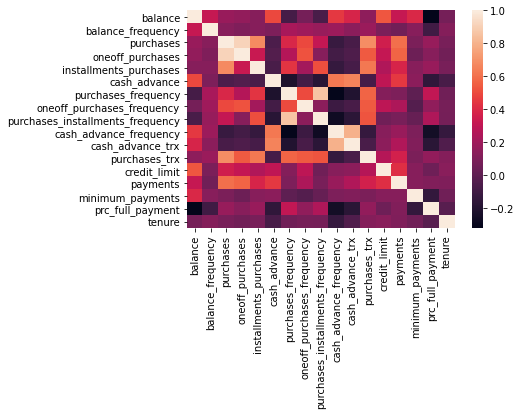

In [7]:
bank_corr = bank.corr()
sns.heatmap(bank_corr)

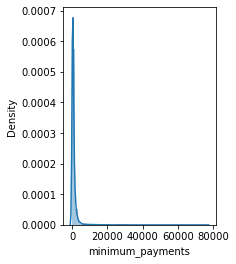

In [8]:
#clean data
#There are 1 missing data in credit_limit and 313 missing data in minimum_payments.
#since there is only one data missing in credit_limit, so we decided to drop it, but for the minimum_payments, we plotted the distribution first to see how the data looks like. 
plt.subplot(1,2,2)
sns.distplot(bank.minimum_payments.dropna())
plt.show()

In [9]:
#since the data is skewed to the right, we decided to use median fill the null value insteand of the mean
bank['minimum_payments'].fillna(bank['minimum_payments'].median(),inplace=True)

In [10]:
bank.dropna(inplace=True)

In [11]:
#confirm that we fill all the 
bank.isna().sum().sum()

0

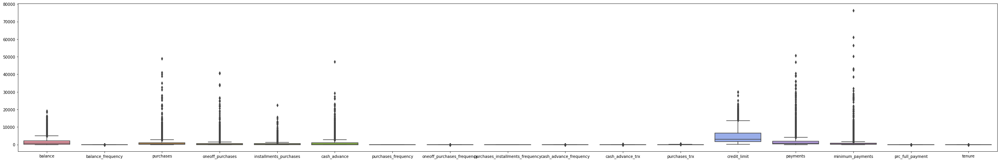

In [12]:
#we can find there are some outliers with several variables, but in this dataset we want to analyze all kind of customers, so we are not going to handle the outliers. 
plt.figure(figsize=(45,7))
sns.boxplot(data=bank)
plt.show()

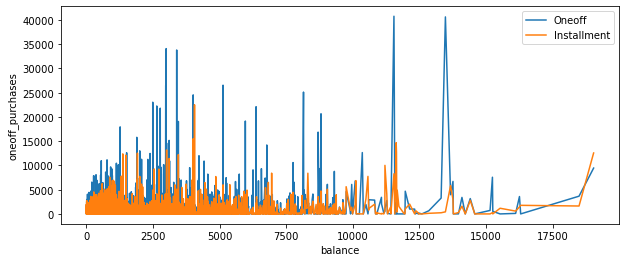

In [13]:
#check if there is a relationship between different types of purchases. 
plt.figure(figsize=(10,4))
sns.lineplot(bank['balance'],bank['oneoff_purchases'],label='Oneoff')
sns.lineplot(bank['balance'],bank['installments_purchases'],label="Installment")
plt.show()

In [14]:
#since the clustering can only have 1500 data each time, so we randomly select 1500 data from original dataset. We are looking for better method of sampling in the future.
bank_sample = bank.sample(n=1500)

In [15]:
#keep only numerical data
bank_num = bank_sample.drop(columns = 'cust_id')

In [16]:
bank_num2 = bank.drop(columns = 'cust_id')

In [17]:
#scale the data then put into dataframe
sc = StandardScaler()
sb = sc.fit_transform(bank_num)
sb = pd.DataFrame(sb, columns = bank_num.columns)

In [18]:
#check the data after scaler
sb.head()

,balance,balance_frequency,purchases,oneoff_purchases,installments_purchases,cash_advance,purchases_frequency,oneoff_purchases_frequency,purchases_installments_frequency,cash_advance_frequency,cash_advance_trx,purchases_trx,credit_limit,payments,minimum_payments,prc_full_payment,tenure
0,-0.131242,0.510600,-0.112360,0.065617,-0.490218,0.726615,-0.773404,-0.104278,-0.899210,1.022100,0.568711,-0.464510,0.679492,-0.572479,-0.273939,-0.519836,0.370091
1,0.248888,-0.100582,-0.224435,-0.329063,0.122509,0.798908,0.932481,-0.667066,0.884148,0.778745,0.272867,-0.234365,-0.536222,-0.436515,0.392407,-0.519836,-3.437428
2,-0.684038,0.510600,-0.357889,-0.238260,-0.490218,-0.518462,-0.979289,-0.385674,-0.899210,-0.681388,-0.466743,-0.541225,-0.684809,-0.516591,-0.324362,-0.519836,0.370091
3,0.303923,0.510600,0.271333,-0.329063,1.591258,-0.467888,-0.361641,-0.667066,-0.275035,-0.255517,-0.318821,-0.196007,-0.671301,0.147108,0.711967,-0.519836,0.370091
4,-0.638193,-0.267267,-0.431257,-0.329063,-0.490218,-0.168376,-1.185171,-0.667066,-0.899210,0.596229,-0.022977,-0.579583,-0.779365,0.061511,-0.362558,-0.519836,0.370091


In [19]:
#going to do euclidean,cosine, manhattan and jacard distance.
diste = pdist(sb.values)
distc = pdist(sb.values, metric='cosine')
distm = pdist(sb.values, metric='cityblock')
distj = pdist(sb.values, metric='jaccard')

In [20]:
hclust_e = linkage(diste)
hclust_c = linkage(distc)
hclust_m = linkage(distm)
hclust_j = linkage(distj)

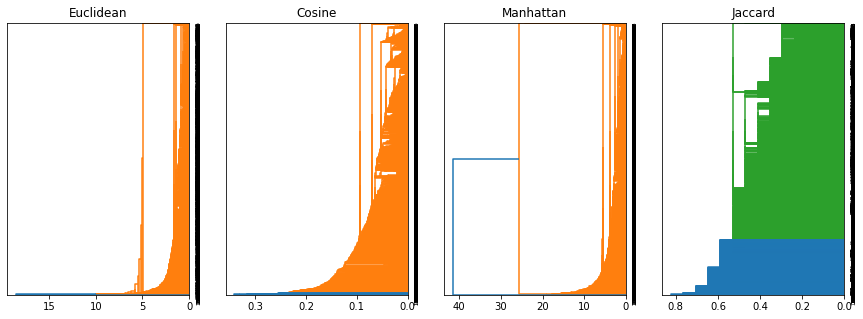

In [21]:
#plot with euclidean, cosine, manhattan and jaccard method
LINKS = [hclust_e, hclust_c, hclust_m, hclust_j]
TITLE = ['Euclidean', 'Cosine','Manhattan','Jaccard']

plt.figure(figsize=(15,5))

#loop and build our plot
for i, m in enumerate(LINKS):
  plt.subplot(1,4,i+1)
  plt.title(TITLE[i])
  dendrogram(m,
             #labels = ps.index
             leaf_rotation=90,
             # leaf_font_size=10,
             orientation='left')
plt.show()

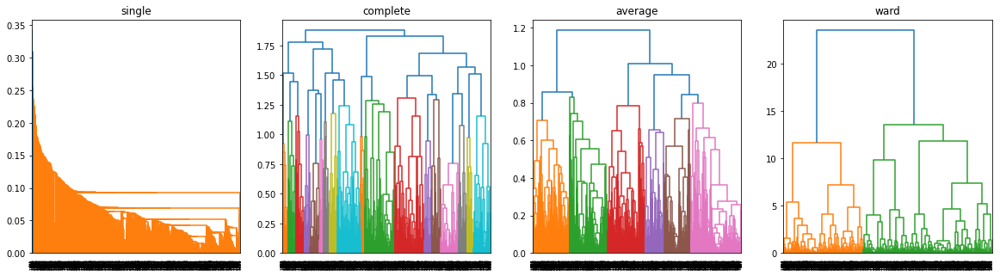

In [22]:
#plot with single, complete, average, ward methods with cosine since the plot for cosine is the best among others
METHODS = ['single', 'complete', 'average','ward']
plt.figure(figsize=(20,5))

for i, m in enumerate(METHODS):
  plt.subplot(1,4,i+1)
  plt.title(m)
  dendrogram(linkage(distc, method=m),
             leaf_rotation=90)
plt.show()

In [24]:
#using the plot above and consider the silo plot, i am going to use average with 5 and 9 clusters
labs5a = fcluster(linkage(distc, method='average'), 5, criterion='maxclust')
labs9a = fcluster(linkage(distc, method='average'), 9, criterion='maxclust')

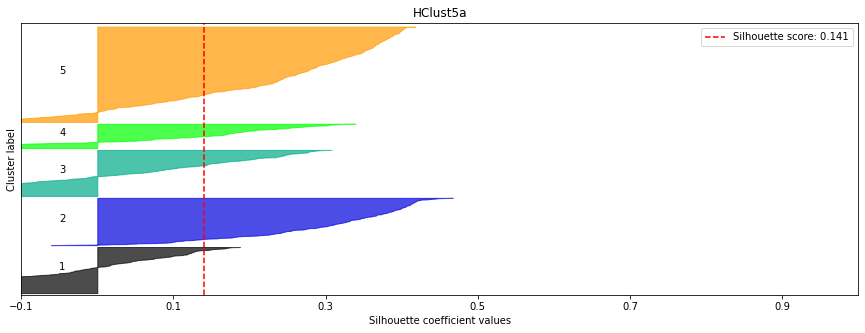

In [25]:
#find the sihouette score with h-clustering for 5 clusters with average method.  
skplot.metrics.plot_silhouette(sb, labs5a, title="HClust5a", figsize=(15,5))
plt.show()

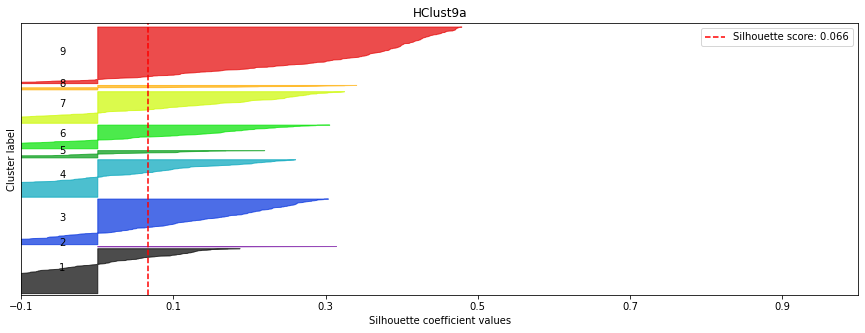

In [26]:
#find the sihouette score with h-clustering for 5 clusters with average method.  
skplot.metrics.plot_silhouette(sb, labs9a, title="HClust9a", figsize=(15,5))
plt.show()

In [19]:
#scale the data then put into dataframe
sc = StandardScaler()
sb2 = sc.fit_transform(bank_num2)
sb2 = pd.DataFrame(sb2, columns = bank_num2.columns)

In [20]:
#kmean
KS = range(2,30)

#storage
inertia = []
silo = []

for k in KS:
    km = KMeans(k)
    km.fit(sb2)
    labs = km.predict(sb2)
    inertia.append(km.inertia_)
    silo.append(silhouette_score(sb2,labs))

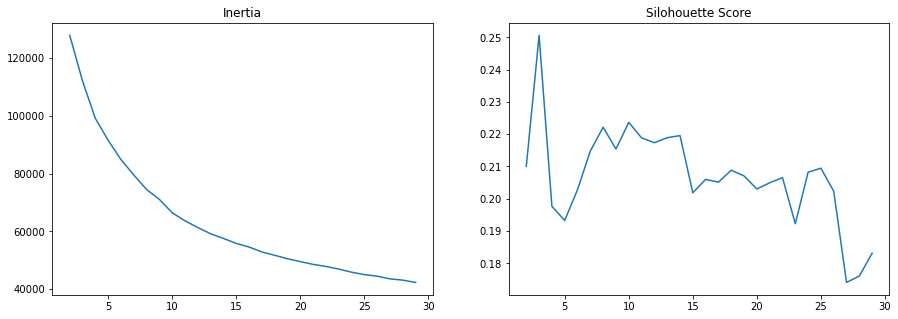

In [21]:
#plot both inertia and silohouette score to find a better k value.
plt.figure(figsize = (15,5))

plt.subplot(1, 2, 1)
plt.title("Inertia")
sns.lineplot(KS, inertia)

plt.subplot(1, 2, 2)
plt.title("Silohouette Score")
sns.lineplot(KS, silo)

plt.show()

In [22]:
k4 = KMeans(4)
k4.fit(sb2)
k4_labs = k4.predict(sb2)

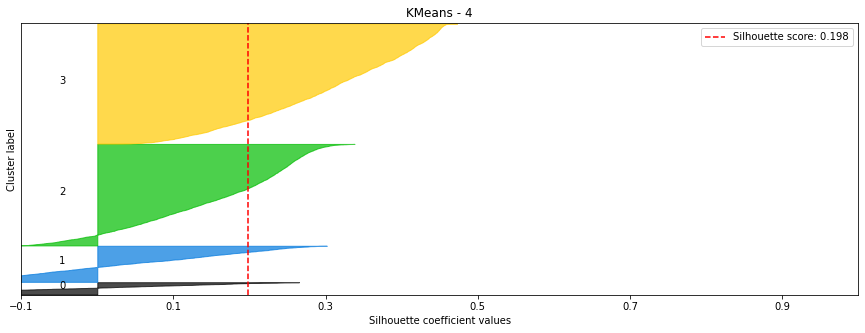

In [23]:
skplot.metrics.plot_silhouette(sb2,k4_labs , title="KMeans - 4", figsize=(15,5))
plt.show()

In [24]:
k6 = KMeans(6)
k6.fit(sb2)
k6_labs = k6.predict(sb2)

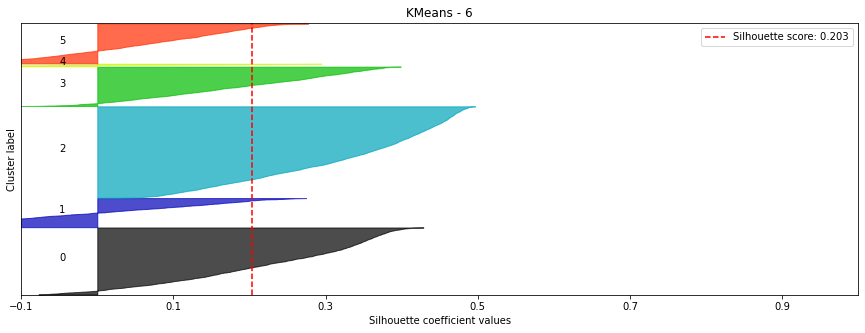

In [25]:
#find the sihouette score with kmean for 5 clusters. 
skplot.metrics.plot_silhouette(sb2,k6_labs , title="KMeans - 6", figsize=(15,5))
plt.show()

In [26]:
k9 = KMeans(9)
k9.fit(sb2)
k9_labs = k9.predict(sb2)

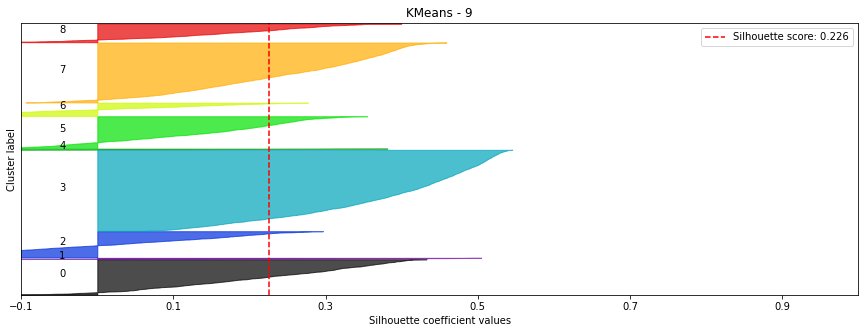

In [27]:
#find the sihouette score with kmean for 9 clusters. 
skplot.metrics.plot_silhouette(sb2,k9_labs , title="KMeans - 9", figsize=(15,5))
plt.show()

In [28]:
k7 = KMeans(7)
k7.fit(sb2)
k7_labs = k7.predict(sb2)

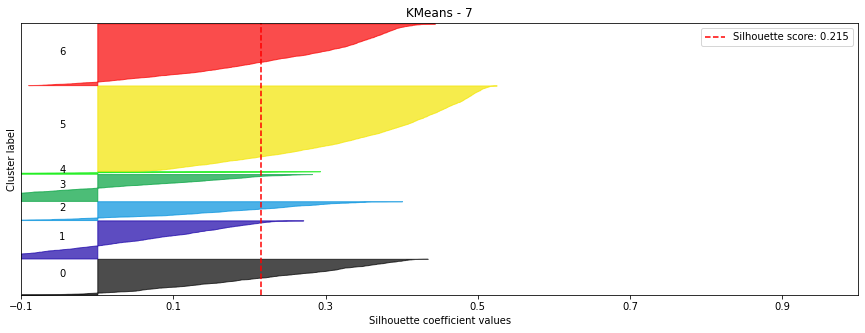

In [29]:
#find the sihouette score with kmean for 9 clusters. 
skplot.metrics.plot_silhouette(sb2,k7_labs , title="KMeans - 7", figsize=(15,5))
plt.show()

In [30]:
#fit the PCA model and applies
snp = StandardScaler().fit_transform(bank_num2)
pca = PCA()
pcs = pca.fit_transform(snp)

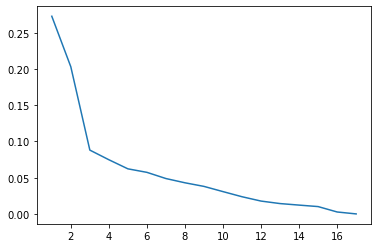

In [31]:
#the attribute shows how much variance is explained by each of individual components
varexp = pca.explained_variance_ratio_
type(varexp)
varexp.shape
varexp

sns.lineplot(range(1, len(varexp)+1), varexp)
plt.show()

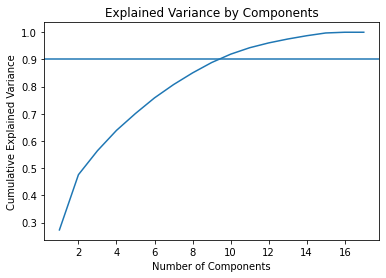

In [32]:
plt.title("Cumulative Explained Variance")
plt.plot(range(1, len(varexp)+1), np.cumsum(varexp))
plt.axhline(.90)
plt.title('Explained Variance by Components')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.show()

In [33]:
# i am going to choose components 9 seems the right choice according to the previous graph which explain 90% data. 
pca = PCA(n_components = 9)
#fit the model
pca.fit(snp)

pca_score = pca.transform(snp)
pca_score.shape

(8949, 9)

In [34]:
#k mean clustering with PCA
kmean_pca = KMeans(n_clusters=5)
kmean_pca.fit(pca_score)
kmean_pca_lab5 = kmean_pca.predict(pca_score)

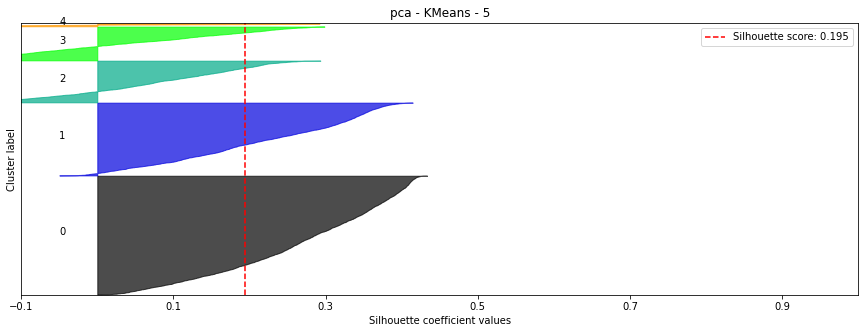

In [35]:
skplot.metrics.plot_silhouette(snp,kmean_pca_lab5 , title="pca - KMeans - 5", figsize=(15,5))
plt.show()

In [36]:
#k mean clustering with PCA
kmean_pca = KMeans(n_clusters=9)
kmean_pca.fit(pca_score)
kmean_pca_lab9 = kmean_pca.predict(pca_score)

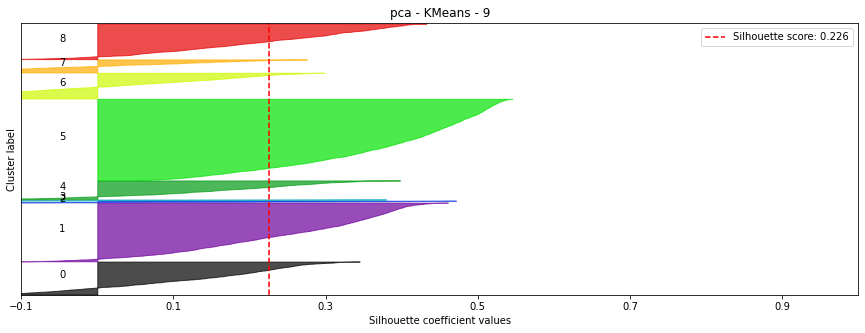

In [37]:
skplot.metrics.plot_silhouette(snp,kmean_pca_lab9 , title="pca - KMeans - 9", figsize=(15,5))
plt.show()

In [38]:
#k mean clustering with PCA
kmean_pca = KMeans(n_clusters=7)
kmean_pca.fit(pca_score)
kmean_pca_lab7 = kmean_pca.predict(pca_score)

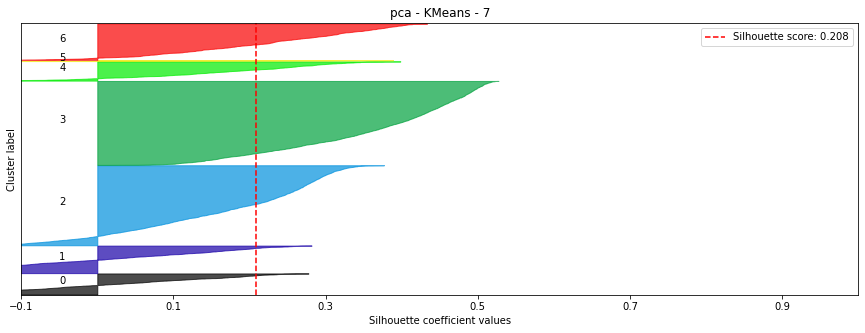

In [39]:
skplot.metrics.plot_silhouette(snp,kmean_pca_lab7 , title="pca - KMeans - 7", figsize=(15,5))
plt.show()

In [40]:
kmean_pca = KMeans(n_clusters=4)
kmean_pca.fit(pca_score)
kmean_pca_lab4 = kmean_pca.predict(pca_score)

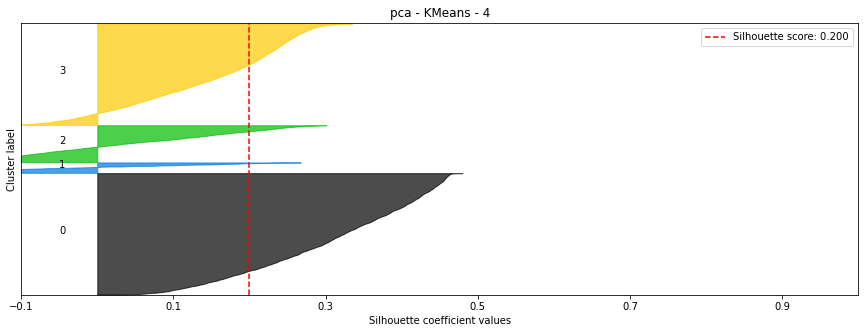

In [41]:
skplot.metrics.plot_silhouette(snp,kmean_pca_lab4 , title="pca - KMeans - 4", figsize=(15,5))
plt.show()

In [42]:
kmean_pca = KMeans(n_clusters=6)
kmean_pca.fit(pca_score)
kmean_pca_lab6 = kmean_pca.predict(pca_score)

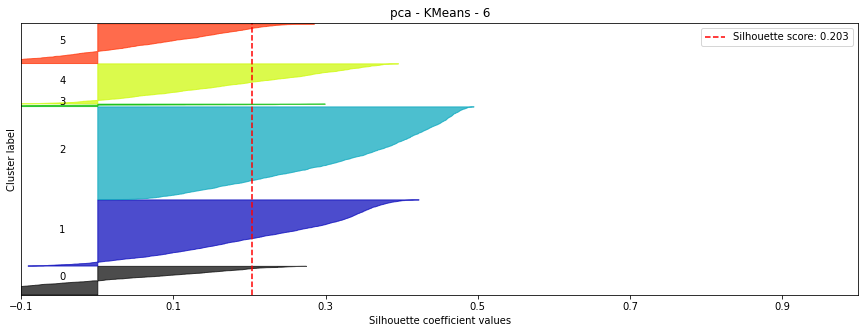

In [43]:
skplot.metrics.plot_silhouette(snp,kmean_pca_lab6 , title="pca - KMeans - 6", figsize=(15,5))
plt.show()

In [45]:
#profile the cluster solutions
bank_num2['pca-kmean4'] = kmean_pca_lab4
clus_profile_mean = bank_num2.groupby('pca-kmean4').mean()
clus_profile_mean.T

pca-kmean4,0,1,2,3
balance,998.195890,3792.753894,4553.369135,926.686496
balance_frequency,0.788306,0.986469,0.968599,0.939643
purchases,276.563417,8385.523343,488.954260,1305.295110
oneoff_purchases,212.398168,5632.726395,311.262829,634.095271
installments_purchases,64.429085,2754.541134,177.774563,671.474789
cash_advance,575.642836,771.631916,4472.104642,211.285728
purchases_frequency,0.179557,0.943076,0.282667,0.892191
oneoff_purchases_frequency,0.087252,0.743257,0.136571,0.309168
purchases_installments_frequency,0.088544,0.779748,0.181383,0.719282
cash_advance_frequency,0.111979,0.079189,0.480243,0.042940


In [47]:
clus_profile_median = bank_num2.groupby('pca-kmean4').median()
clus_profile_median.T

pca-kmean4,0,1,2,3
balance,743.317607,2769.998931,4215.771256,349.203438
balance_frequency,1.000000,1.000000,1.000000,1.000000
purchases,85.900000,6485.425000,79.800000,941.515000
oneoff_purchases,0.000000,4062.215000,0.000000,197.695000
installments_purchases,0.000000,1927.160000,0.000000,467.450000
cash_advance,101.420215,0.000000,3607.406242,0.000000
purchases_frequency,0.083333,1.000000,0.083333,1.000000
oneoff_purchases_frequency,0.000000,0.833333,0.000000,0.166667
purchases_installments_frequency,0.000000,1.000000,0.000000,0.833333
cash_advance_frequency,0.083333,0.000000,0.500000,0.000000


In [50]:
bank_num2['pca-kmean7'] = kmean_pca_lab7
clus_profile_mean = bank_num2.groupby('pca-kmean7').mean()
clus_profile_mean.T

pca-kmean7,0,1,2,3,4,5,6
balance,2763.446210,4955.271048,827.843418,1598.949883,866.747212,5469.786878,108.822888
balance_frequency,0.985293,0.971342,0.961316,0.974215,0.798862,0.958651,0.372622
purchases,4882.732454,530.097249,1084.270920,267.909603,402.760328,24597.057419,343.865859
oneoff_purchases,3186.608188,330.274476,451.003034,217.663491,248.474422,17745.470323,205.711444
installments_purchases,1696.980185,199.933766,633.491127,50.530276,154.754656,6851.587097,138.400722
cash_advance,511.134922,5106.912388,185.464309,750.447756,1107.736310,1798.881876,306.940799
purchases_frequency,0.950882,0.305124,0.887259,0.161372,0.420784,0.913441,0.275083
oneoff_purchases_frequency,0.729084,0.145707,0.269596,0.093445,0.121905,0.765054,0.072017
purchases_installments_frequency,0.749548,0.199311,0.722863,0.067840,0.280911,0.762366,0.195713
cash_advance_frequency,0.069016,0.511540,0.039198,0.151552,0.195214,0.080645,0.030968


In [51]:
bank_num2['pca-kmean6'] = kmean_pca_lab6
clus_profile_mean = bank_num2.groupby('pca-kmean6').mean()
clus_profile_mean.T

pca-kmean6,0,1,2,3,4,5
balance,4869.307722,721.743685,1556.765568,4501.239524,116.578298,1882.292677
balance_frequency,0.966036,0.951870,0.966423,0.975196,0.377906,0.978701
purchases,566.305063,891.777589,264.816714,16231.873333,329.538524,2985.793374
oneoff_purchases,344.179023,182.880000,217.465156,11050.770741,207.680279,2085.481893
installments_purchases,222.232836,709.713458,47.512234,5181.102593,122.081739,900.311481
cash_advance,5103.866441,204.144482,808.569623,1000.029225,333.985624,334.495774
purchases_frequency,0.310086,0.882490,0.163691,0.925720,0.270849,0.927392
oneoff_purchases_frequency,0.147178,0.095276,0.101119,0.764927,0.077436,0.752844
purchases_installments_frequency,0.203654,0.819435,0.064289,0.777273,0.184631,0.580580
cash_advance_frequency,0.517389,0.041550,0.161234,0.076132,0.037993,0.055169


<AxesSubplot:ylabel='pca-kmean4'>

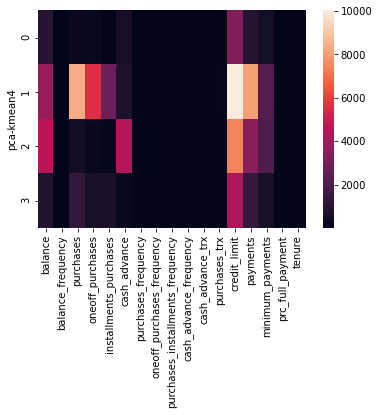

In [48]:
sns.heatmap(clus_profile_mean)